In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [4]:
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score
from sklearn.preprocessing import StandardScaler,LabelEncoder,OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report,accuracy_score,roc_auc_score,recall_score,precision_score


In [5]:
df_train = pd.read_csv('train.csv')
df_test = pd.read_csv('test.csv')

In [48]:
df_train.columns

Index(['id', 'Gender', 'Age', 'Height', 'Weight',
       'family_history_with_overweight', 'FAVC', 'FCVC', 'NCP', 'CAEC',
       'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS', 'NObeyesdad'],
      dtype='object')

In [8]:
df_test.columns

Index(['id', 'Gender', 'Age', 'Height', 'Weight',
       'family_history_with_overweight', 'FAVC', 'FCVC', 'NCP', 'CAEC',
       'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS'],
      dtype='object')

##### Split the data

In [49]:
X_train = df_train.drop(columns=['id','NObeyesdad'])
X_test = df_test.drop(columns=['id'])
y_train = df_train['NObeyesdad']
y_test = df_test.drop(columns=['id'])

In [50]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(20758, 16)
(13840, 16)
(20758,)
(13840, 16)


##### Split the column types

In [8]:
num_features = X_train.select_dtypes(exclude="object").columns
cat_features = X_train.select_dtypes(include="object").columns

##### Pre Process & Col Transform

In [9]:
numeric_transformer = StandardScaler()
cat_transformer = OneHotEncoder(handle_unknown='ignore')

preprocessor = ColumnTransformer(
    transformers=[
        'cat',cat_transformer,cat_features,
        'num',numeric_transformer,num_features
    ]
)

In [10]:
X_train.shape,X_test.shape

((20758, 16), (13840, 16))

### EDA

In [13]:
df_train.describe()

,id,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE
count,20758.00000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000
mean,10378.50000,23.841804,1.700245,87.887768,2.445908,2.761332,2.029418,0.981747,0.616756
std,5992.46278,5.688072,0.087312,26.379443,0.533218,0.705375,0.608467,0.838302,0.602113
min,0.00000,14.000000,1.450000,39.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,5189.25000,20.000000,1.631856,66.000000,2.000000,3.000000,1.792022,0.008013,0.000000
50%,10378.50000,22.815416,1.700000,84.064875,2.393837,3.000000,2.000000,1.000000,0.573887
75%,15567.75000,26.000000,1.762887,111.600553,3.000000,3.000000,2.549617,1.587406,1.000000
max,20757.00000,61.000000,1.975663,165.057269,3.000000,4.000000,3.000000,3.000000,2.000000


In [14]:
df_train['NObeyesdad'].value_counts()

NObeyesdad
Obesity_Type_III       4046
Obesity_Type_II        3248
Normal_Weight          3082
Obesity_Type_I         2910
Insufficient_Weight    2523
Overweight_Level_II    2522
Overweight_Level_I     2427
Name: count, dtype: int64

In [15]:
import seaborn as sns

In [16]:
df_train.isna().sum()

id                                0
Gender                            0
Age                               0
Height                            0
Weight                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                             0
CH2O                              0
SCC                               0
FAF                               0
TUE                               0
CALC                              0
MTRANS                            0
NObeyesdad                        0
dtype: int64

In [17]:
df_test.isna().sum()

id                                0
Gender                            0
Age                               0
Height                            0
Weight                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                             0
CH2O                              0
SCC                               0
FAF                               0
TUE                               0
CALC                              0
MTRANS                            0
dtype: int64

In [18]:
df_train.duplicated().sum()

0

In [19]:
df_test.duplicated().sum()

0

In [20]:
df_train.nunique()

id                                20758
Gender                                2
Age                                1703
Height                             1833
Weight                             1979
family_history_with_overweight        2
FAVC                                  2
FCVC                                934
NCP                                 689
CAEC                                  4
SMOKE                                 2
CH2O                               1506
SCC                                   2
FAF                                1360
TUE                                1297
CALC                                  3
MTRANS                                5
NObeyesdad                            7
dtype: int64

In [21]:
df_train.head(3)

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight


In [11]:
df_train.columns

Index(['id', 'Gender', 'Age', 'Height', 'Weight',
       'family_history_with_overweight', 'FAVC', 'FCVC', 'NCP', 'CAEC',
       'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS', 'NObeyesdad'],
      dtype='object')

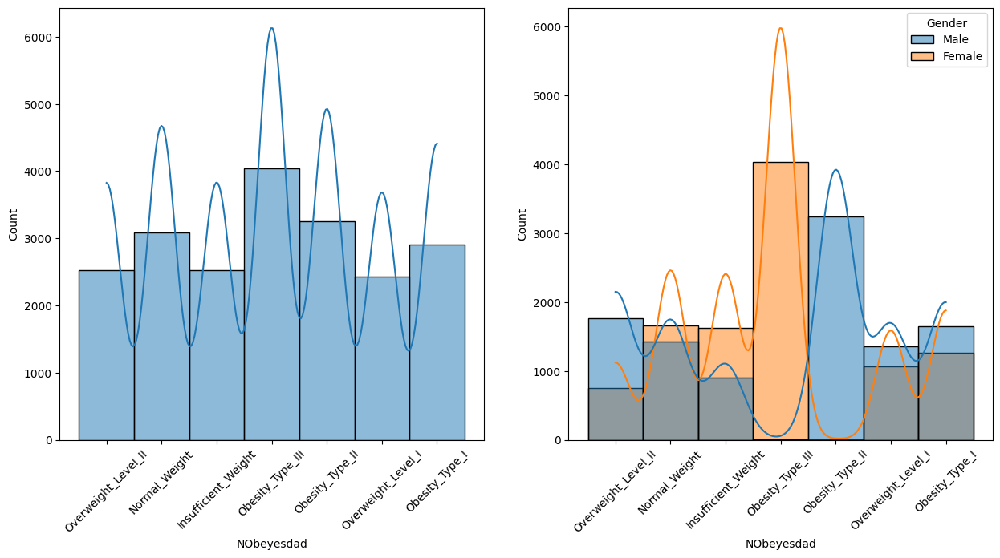

In [25]:
fig, axs = plt.subplots(1,2,figsize=(15,7))
plt.subplot(121)
sns.histplot(data=df_train,x='NObeyesdad',bins=30,kde=True)
plt.xticks(rotation=45)
plt.subplot(122)
sns.histplot(data=df_train,x='NObeyesdad',bins=30,kde=True,hue='Gender')
plt.xticks(rotation=45)
plt.show()

Seems like females have predominant Type 3 Obesity

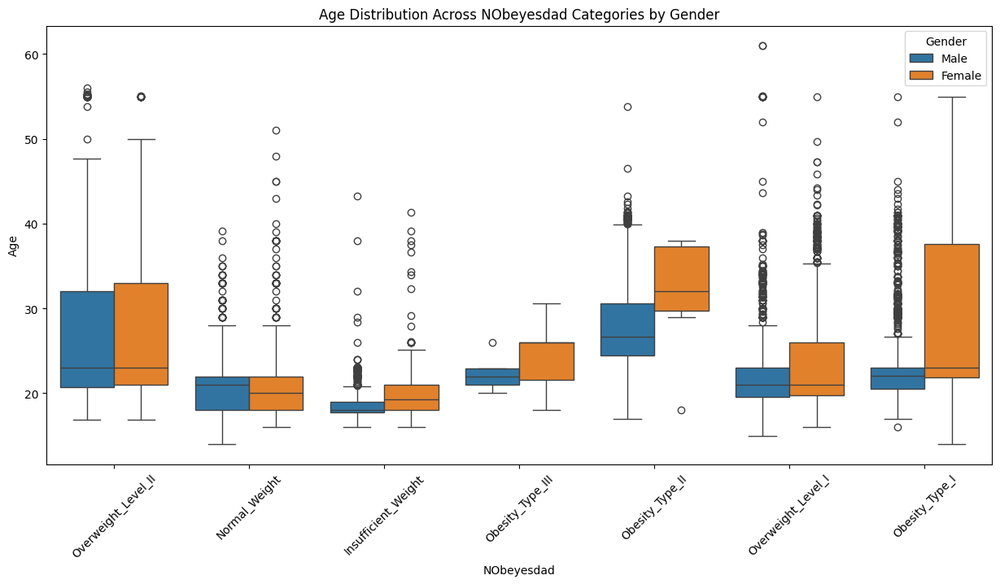

In [29]:
plt.figure(figsize=(15, 7))
sns.boxplot(data=df_train, x='NObeyesdad', y='Age', hue='Gender')
plt.xticks(rotation=45)
plt.title('Age Distribution Across NObeyesdad Categories by Gender')
plt.show()

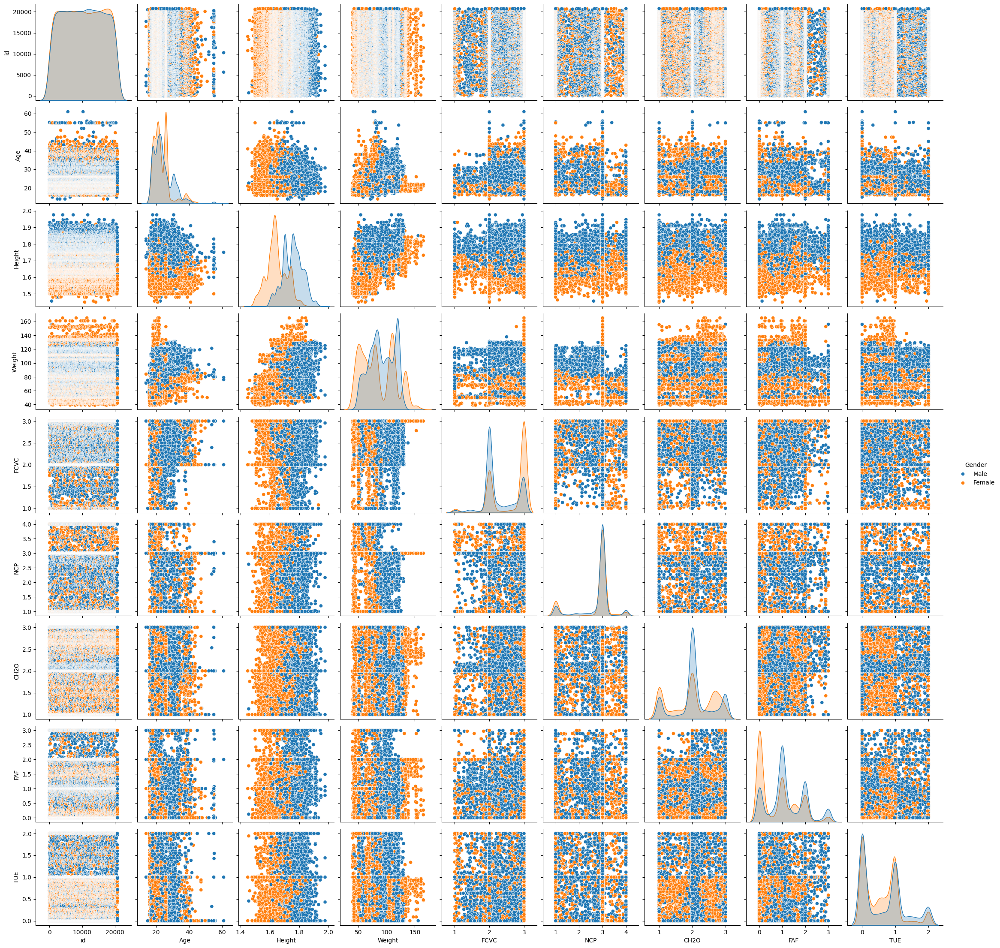

In [35]:
sns.pairplot(df_train,hue = 'Gender')
plt.show()

C:\Users\nikil\AppData\Local\Temp\ipykernel_24028\2798707843.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_train,x='NObeyesdad',palette='pastel')


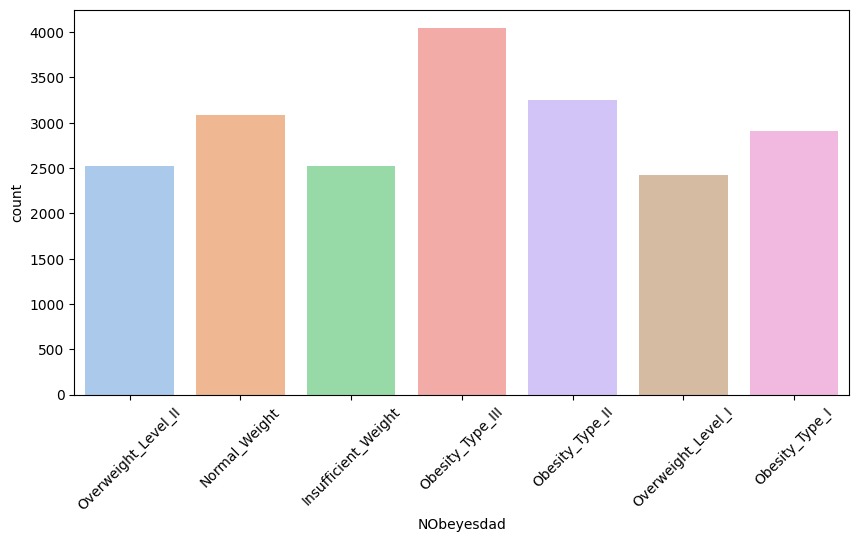

In [36]:
# Target Variable

plt.figure(figsize=(10,5))
sns.countplot(data=df_train,x='NObeyesdad',palette='pastel')
plt.xticks(rotation=45)
plt.show()

In [39]:
num_features

Index(['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE'], dtype='object')

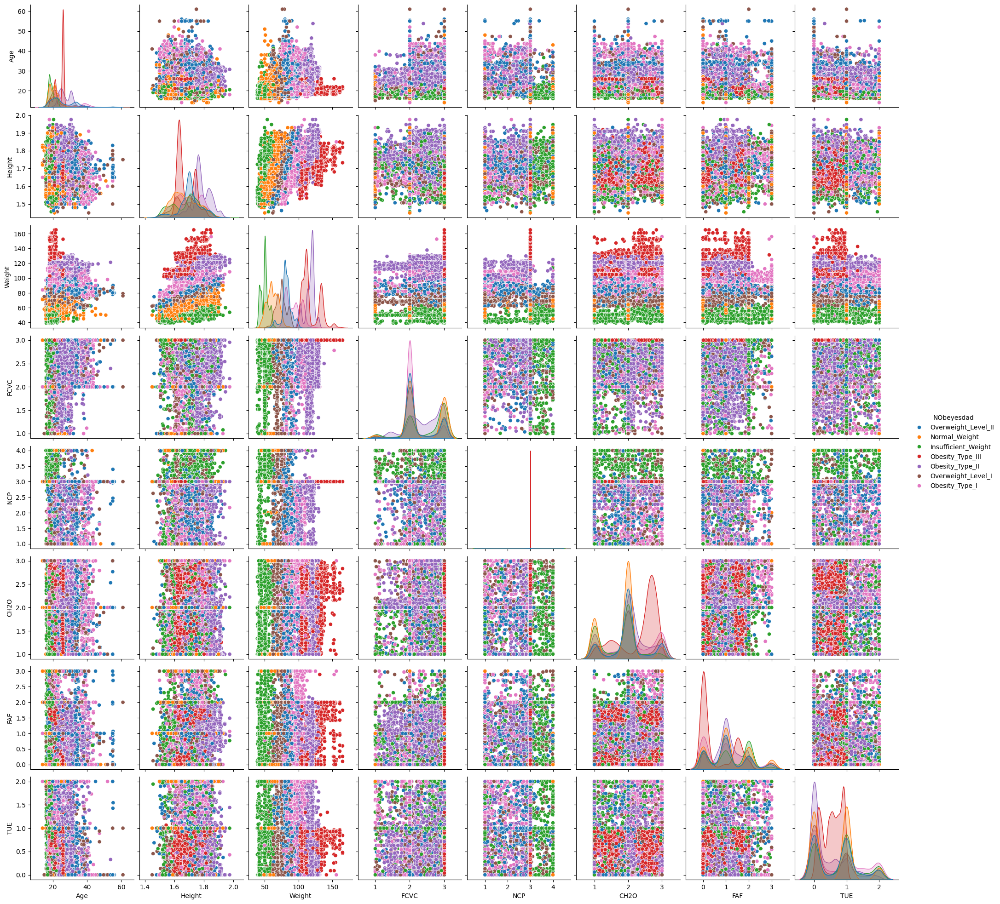

In [41]:
#corelation for numerical cols
sns.pairplot(data=df_train,vars=num_features,hue='NObeyesdad')
plt.show()

In [12]:
from scipy.stats import chi2_contingency

for col in cat_features:
    contingency_table = pd.crosstab(df_train[col], df_train['NObeyesdad'])
    chi2, p, dof, _ = chi2_contingency(contingency_table)
    print(f"Feature: {col}, Chi-Square: {chi2:.2f}, p-value: {p:.4f}")


Feature: Gender, Chi-Square: 7953.77, p-value: 0.0000
Feature: family_history_with_overweight, Chi-Square: 6423.32, p-value: 0.0000
Feature: FAVC, Chi-Square: 1553.63, p-value: 0.0000
Feature: CAEC, Chi-Square: 6897.33, p-value: 0.0000
Feature: SMOKE, Chi-Square: 216.30, p-value: 0.0000
Feature: SCC, Chi-Square: 1024.80, p-value: 0.0000
Feature: CALC, Chi-Square: 4013.08, p-value: 0.0000
Feature: MTRANS, Chi-Square: 2349.08, p-value: 0.0000


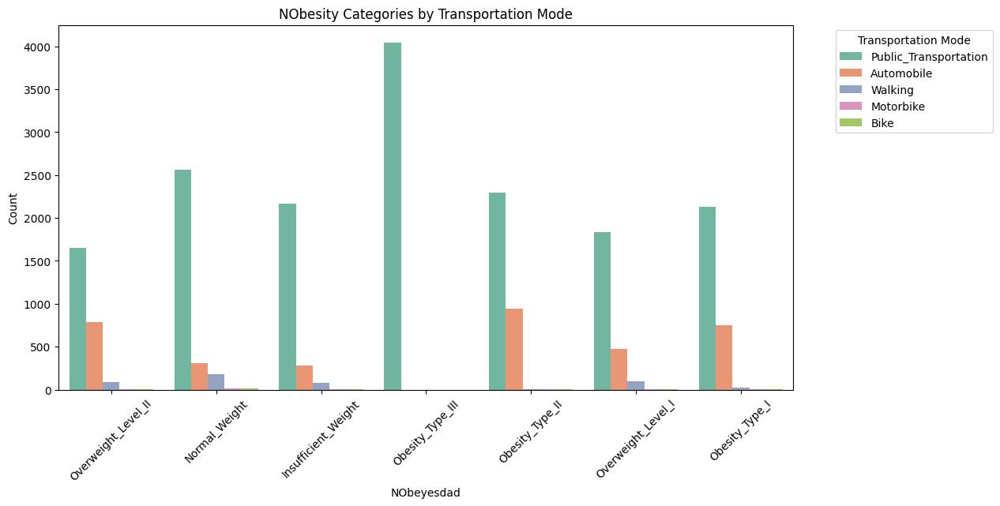

In [45]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df_train, x='NObeyesdad', hue='MTRANS', palette='Set2')
plt.title('NObesity Categories by Transportation Mode')
plt.xticks(rotation=45)
plt.ylabel('Count')
plt.legend(title='Transportation Mode', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [13]:
# Define Models
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier,AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from catboost import CatBoostClassifier
from xgboost import XGBClassifier

models = {
    'Logistic Regression': LogisticRegression(max_iter=1000, multi_class='multinomial'),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'Ada Boosting': AdaBoostClassifier(random_state=42),
    'SVM': SVC(probability=True),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Naive Bayes': GaussianNB(),
    'Cat Boosting': CatBoostClassifier(),
    'XGB': XGBClassifier()
}


In [52]:
best_model = None
best_score = 0

for name,model in models.items():

    pipeline = Pipeline(steps=[('preprocessor',preprocessor),('classifier',model)])

    score = cross_val_score(pipeline,X_train,y_train,cv=5,scoring='accuracy')
    print(f"{name}: Score = {score:.4f}")
    mean_score = score.mean()
    print(f"{name}: Mean Accuracy = {mean_score:.4f}")

    if mean_score > best_score:
        best_score = mean_score
        best_model = pipeline

print(f"\nBest Model: {best_model.named_steps['classifier'].__class__.__name__} with Accuracy = {best_score:.4f}")






ValueError: 
All the 5 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\nikil\anaconda3\envs\mlenv\Lib\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\nikil\anaconda3\envs\mlenv\Lib\site-packages\sklearn\base.py", line 1474, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\nikil\anaconda3\envs\mlenv\Lib\site-packages\sklearn\pipeline.py", line 471, in fit
    Xt = self._fit(X, y, routed_params)
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\nikil\anaconda3\envs\mlenv\Lib\site-packages\sklearn\pipeline.py", line 408, in _fit
    X, fitted_transformer = fit_transform_one_cached(
                            ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\nikil\anaconda3\envs\mlenv\Lib\site-packages\joblib\memory.py", line 312, in __call__
    return self.func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\nikil\anaconda3\envs\mlenv\Lib\site-packages\sklearn\pipeline.py", line 1303, in _fit_transform_one
    res = transformer.fit_transform(X, y, **params.get("fit_transform", {}))
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\nikil\anaconda3\envs\mlenv\Lib\site-packages\sklearn\utils\_set_output.py", line 295, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\nikil\anaconda3\envs\mlenv\Lib\site-packages\sklearn\base.py", line 1474, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\nikil\anaconda3\envs\mlenv\Lib\site-packages\sklearn\compose\_column_transformer.py", line 903, in fit_transform
    self._validate_transformers()
  File "c:\Users\nikil\anaconda3\envs\mlenv\Lib\site-packages\sklearn\compose\_column_transformer.py", line 461, in _validate_transformers
    names, transformers, _ = zip(*self.transformers)
                             ^^^^^^^^^^^^^^^^^^^^^^^
TypeError: 'OneHotEncoder' object is not iterable


In [22]:
X_test.shape

(13840, 16)

In [34]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Assuming X_train and y_train are your feature and target data respectively
# Encode the target labels (y_train) into numeric values
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Define transformers for categorical and numeric features
cat_transformer = OneHotEncoder(handle_unknown='ignore')
numeric_transformer = StandardScaler()

# ColumnTransformer to handle categorical and numerical features
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', cat_transformer, cat_features),
        ('num', numeric_transformer, num_features)
    ]
)

best_model = None
best_score = 0

# Iterate through models to find the best one
for name, model in models.items():
    # Create the pipeline
    pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', model)])

    # Perform cross-validation
    score = cross_val_score(pipeline, X_train, y_train_encoded, cv=5, scoring='accuracy')
    print(f"{name}: Scores = {score}")
    mean_score = score.mean()
    print(f"{name}: Mean Accuracy = {mean_score:.4f}")

    # Track the best model
    if mean_score > best_score:
        best_score = mean_score
        best_model = pipeline

# Output the best model
print(f"\nBest Model: {best_model.named_steps['classifier'].__class__.__name__} with Accuracy = {best_score:.4f}")


ValueError: y should be a 1d array, got an array of shape (13840, 16) instead.

In [ ]:
best_model

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  Index(['Gender', 'family_history_with_overweight', 'FAVC', 'CAEC', 'SMOKE',
       'SCC', 'CALC', 'MTRANS'],
      dtype='object')),
                                                 ('num', StandardScaler(),
                                                  Index(['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE'], dtype='object'))])),
                ('classifier',
                 <catboost.core.CatBoostClassifier object at 0x00000266BF1FF950>)])

In [52]:
if best_model is not None:
    # Fit the best model with the training data
    best_model.fit(X_train, y_train_encoded)  # Use y_train_encoded directly

    # If y_test is not available, generate predictions on X_test
    print("\nNo labels provided in the test data. Generating predictions only.")
    y_pred = best_model.predict(X_test)

    y_pred = y_pred.flatten()
    # Output Predictions (Optional)
    output = pd.DataFrame({'Id': df_test['id'], 'Predictions': y_pred})
    output.to_csv('predictions.csv', index=False)

else:
    print("No model was trained. Please ensure best_model is correctly fitted.")

Learning rate set to 0.092363
0:	learn: 1.6493722	total: 22.9ms	remaining: 22.8s
1:	learn: 1.4668462	total: 39.2ms	remaining: 19.5s
2:	learn: 1.3227164	total: 55.9ms	remaining: 18.6s
3:	learn: 1.2088982	total: 71.8ms	remaining: 17.9s
4:	learn: 1.1097654	total: 88.2ms	remaining: 17.6s
5:	learn: 1.0322971	total: 107ms	remaining: 17.7s
6:	learn: 0.9674372	total: 126ms	remaining: 17.8s
7:	learn: 0.9111734	total: 143ms	remaining: 17.7s
8:	learn: 0.8640546	total: 159ms	remaining: 17.6s
9:	learn: 0.8202628	total: 177ms	remaining: 17.5s
10:	learn: 0.7809794	total: 194ms	remaining: 17.5s
11:	learn: 0.7470334	total: 216ms	remaining: 17.8s
12:	learn: 0.7175564	total: 241ms	remaining: 18.3s
13:	learn: 0.6921360	total: 261ms	remaining: 18.4s
14:	learn: 0.6659878	total: 279ms	remaining: 18.3s
15:	learn: 0.6436639	total: 297ms	remaining: 18.3s
16:	learn: 0.6234267	total: 316ms	remaining: 18.2s
17:	learn: 0.6048439	total: 332ms	remaining: 18.1s
18:	learn: 0.5852437	total: 349ms	remaining: 18s
19:	lear